For Pleiades Aircraft Dataset:

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.8/978.8 kB 27.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.7 MB/s eta 0:00:00
🔍 Taille maximale détectée : 2560
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultra

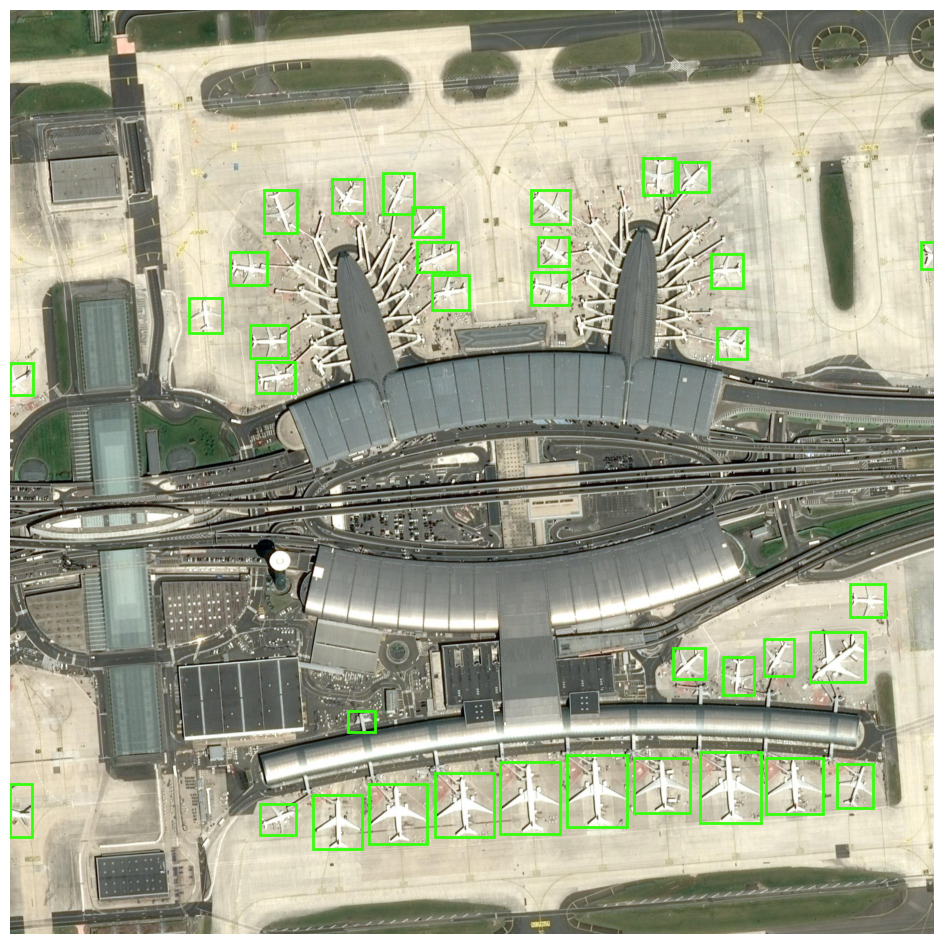

✅ JSON sauvegardé : /content/drive/MyDrive/JSONS_YOLO_Optique/4fdabd34-a2fd-4f0a-bb48-01fe043f1499.json
🖼️  Image annotée sauvegardée : /content/drive/MyDrive/YOLO_Optical_Predicted_Images_Annotated/4fdabd34-a2fd-4f0a-bb48-01fe043f1499.jpg


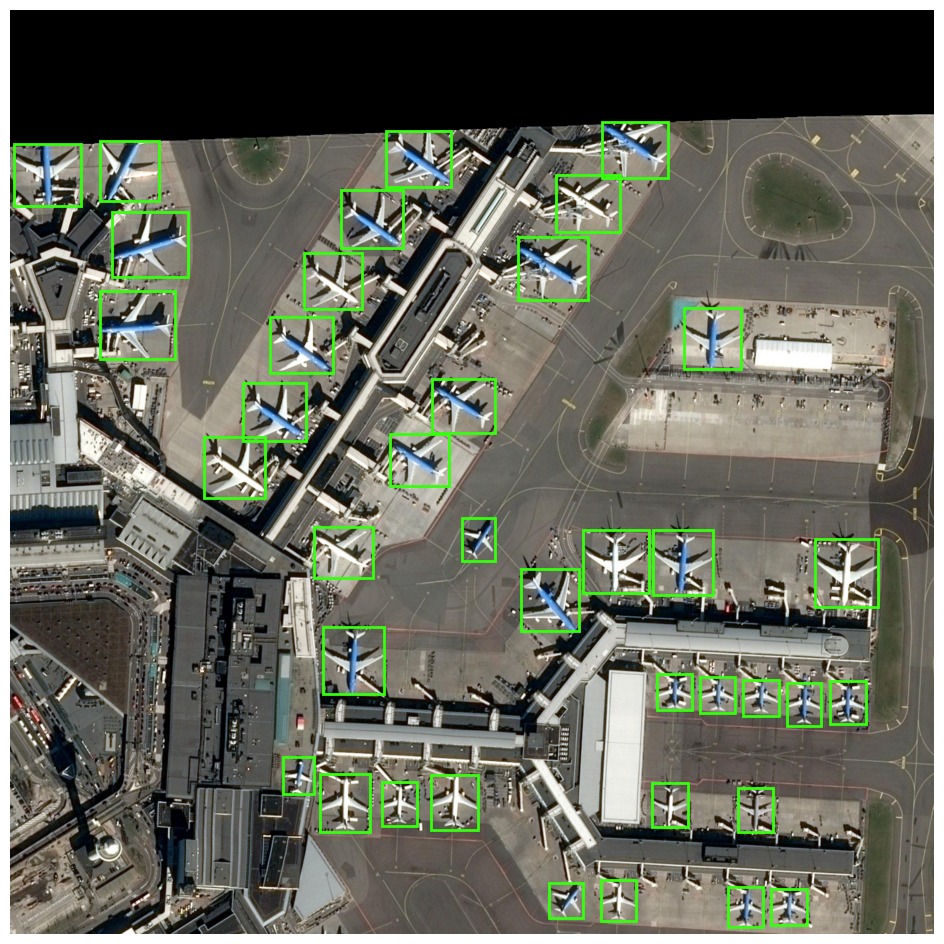

✅ JSON sauvegardé : /content/drive/MyDrive/JSONS_YOLO_Optique/576827bc-a94a-4611-8820-f3d56e969151.json
🖼️  Image annotée sauvegardée : /content/drive/MyDrive/YOLO_Optical_Predicted_Images_Annotated/576827bc-a94a-4611-8820-f3d56e969151.jpg


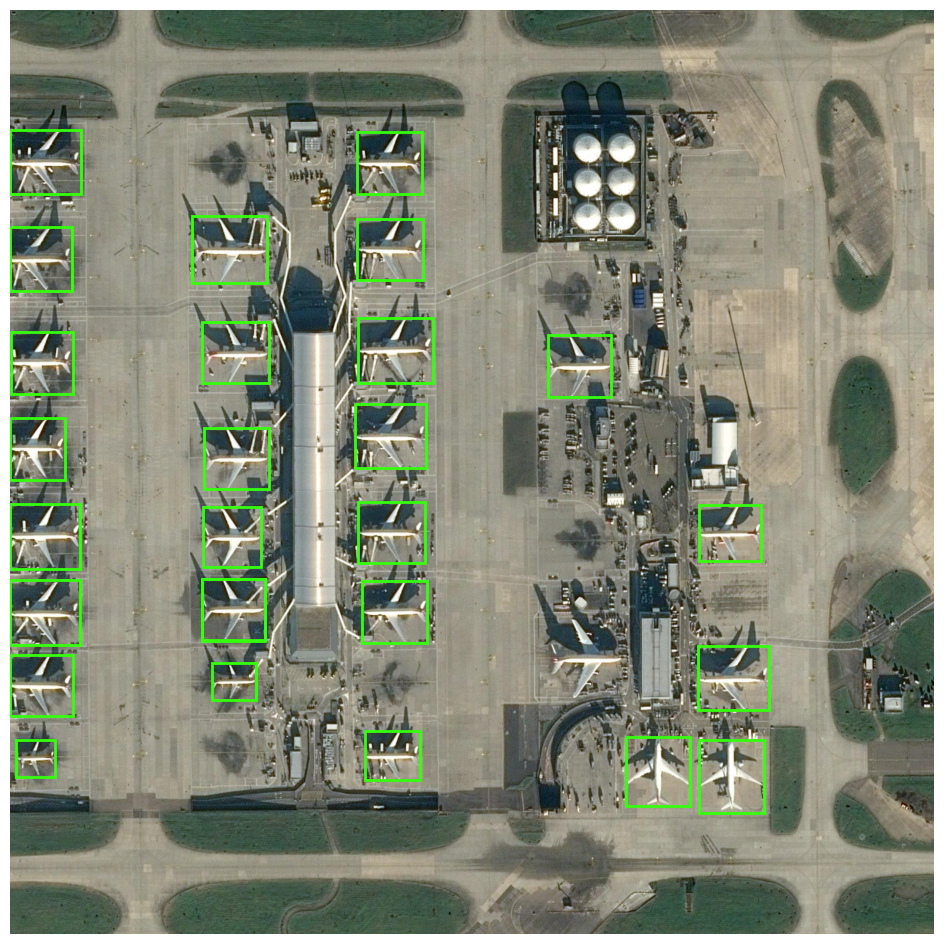

✅ JSON sauvegardé : /content/drive/MyDrive/JSONS_YOLO_Optique/dacabde6-c8a7-475b-ab26-81b4e4dd5977.json
🖼️  Image annotée sauvegardée : /content/drive/MyDrive/YOLO_Optical_Predicted_Images_Annotated/dacabde6-c8a7-475b-ab26-81b4e4dd5977.jpg


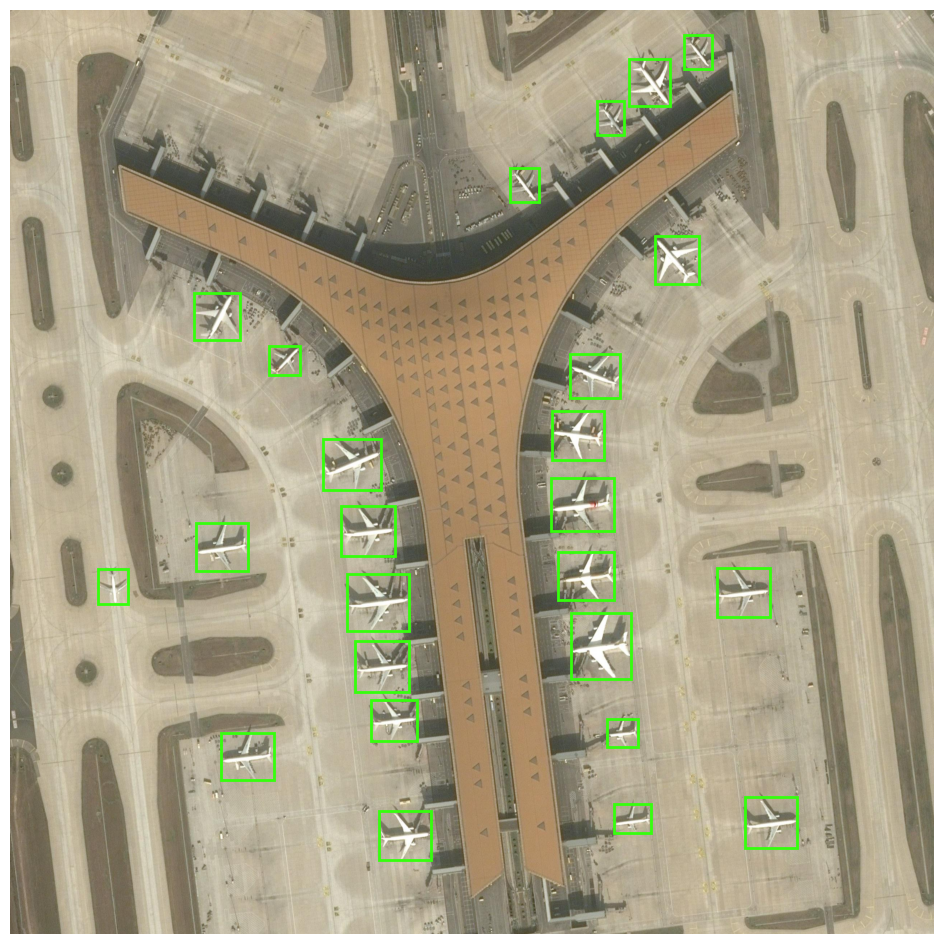

✅ JSON sauvegardé : /content/drive/MyDrive/JSONS_YOLO_Optique/f82d64a6-3bfa-4612-bcbd-847a7d89c296.json
🖼️  Image annotée sauvegardée : /content/drive/MyDrive/YOLO_Optical_Predicted_Images_Annotated/f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg


In [ ]:
# ✅ 1. Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ 2. Install Ultralytics
!pip install -q ultralytics

# ✅ 3. Imports and configuration
import os
import cv2
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

images_dir = "/content/drive/MyDrive/Predicted_Images/"
output_json_dir = "/content/drive/MyDrive/JSONS_YOLO_Optique/"
annotated_images_dir = "/content/drive/MyDrive/YOLO_Optical_Predicted_Images_Annotated/"

os.makedirs(output_json_dir, exist_ok=True)
os.makedirs(annotated_images_dir, exist_ok=True)

image_files = [f for f in os.listdir(images_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]

# ✅ 4. Trouver la taille maximale
max_dim = 0
for img_name in image_files:
    img_path = os.path.join(images_dir, img_name)
    img = cv2.imread(img_path)
    if img is not None:
        h, w = img.shape[:2]
        max_dim = max(max_dim, h, w)
print(f"🔍 Taille maximale détectée : {max_dim}")

# ✅ 5. Prédiction YOLOv10
!yolo task=detect mode=predict \
  model=/content/drive/MyDrive/Pretrained_Custom_Models/YOLO_V10_pleiades.pt \
  conf=0.4 iou=0.5 imgsz={max_dim} \
  source={images_dir} \
  save=True save_txt=True name=predict_all

# ✅ 6. Reading predictions and load images + JSON (sans label)
labels_dir = "/content/runs/detect/predict_all/labels"
categories = [{"id": 0, "name": "Airplane"}, {"id": 1, "name": "Truncated_Airplane"}]

for label_file in sorted(os.listdir(labels_dir)):
    image_name = label_file.replace(".txt", ".jpg")
    image_path = os.path.join(images_dir, image_name)
    label_path = os.path.join(labels_dir, label_file)

    if not os.path.exists(image_path):
        print(f"⚠️ Image non trouvée : {image_path}")
        continue

    img = cv2.imread(image_path)
    height, width = img.shape[:2]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    boxes = []
    annotations = []
    with open(label_path, 'r') as f:
        for ann_id, line in enumerate(f):
            class_id, x_center, y_center, w, h = map(float, line.strip().split())
            x_min = (x_center - w / 2) * width
            y_min = (y_center - h / 2) * height
            box_w = w * width
            box_h = h * height
            boxes.append([x_min, y_min, box_w, box_h])

            annotations.append({
                "id": ann_id,
                "image_id": 0,
                "category_id": int(class_id),
                "bbox": [x_min, y_min, box_w, box_h],
                "area": box_w * box_h,
                "iscrowd": 0
            })

    # 🎯 Matplotlib
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img_rgb)
    for x, y, w, h in boxes:
        rect = Rectangle((x, y), w, h, edgecolor='#35ff0d', linewidth=2, facecolor='none')
        ax.add_patch(rect)
    plt.axis('off')

    # ✅ Displaying
    plt.show()

    # ✅ Save annotated images
    annotated_path = os.path.join(annotated_images_dir, image_name)
    fig.savefig(annotated_path, bbox_inches='tight', pad_inches=0)
    plt.close(fig)

    # ✅ Save Json COCO
    coco_dict = {
        "images": [{
            "id": 0,
            "file_name": image_name,
            "width": width,
            "height": height
        }],
        "annotations": annotations,
        "categories": categories
    }

    json_filename = os.path.splitext(image_name)[0] + ".json"
    json_path = os.path.join(output_json_dir, json_filename)
    with open(json_path, 'w') as json_file:
        json.dump(coco_dict, json_file, indent=2)

    print(f"✅ JSON Saved : {json_path}")
    print(f"🖼️  Annotated Image Saved : {annotated_path}")

For SSDD Dataset:

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.8/978.8 kB 56.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 101.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 110.0 MB/s eta 0:00:00
🔍 Taille maximale détectée : 589
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultr

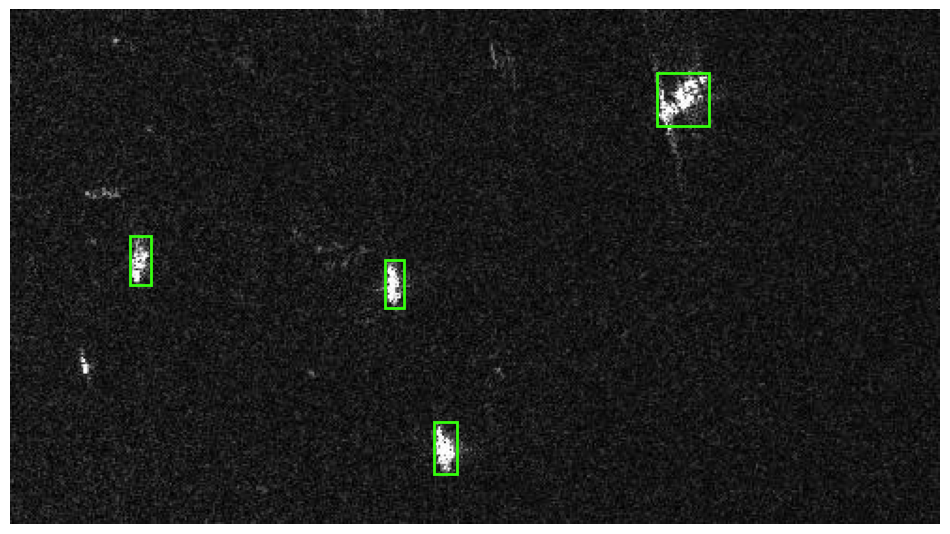

✅ JSON sauvegardé : /content/drive/MyDrive/JSONS_YOLO_SAR/000207.json
🖼️  Image annotée sauvegardée : /content/drive/MyDrive/YOLO_SAR_Predicted_Images_Annotated/000207.jpg


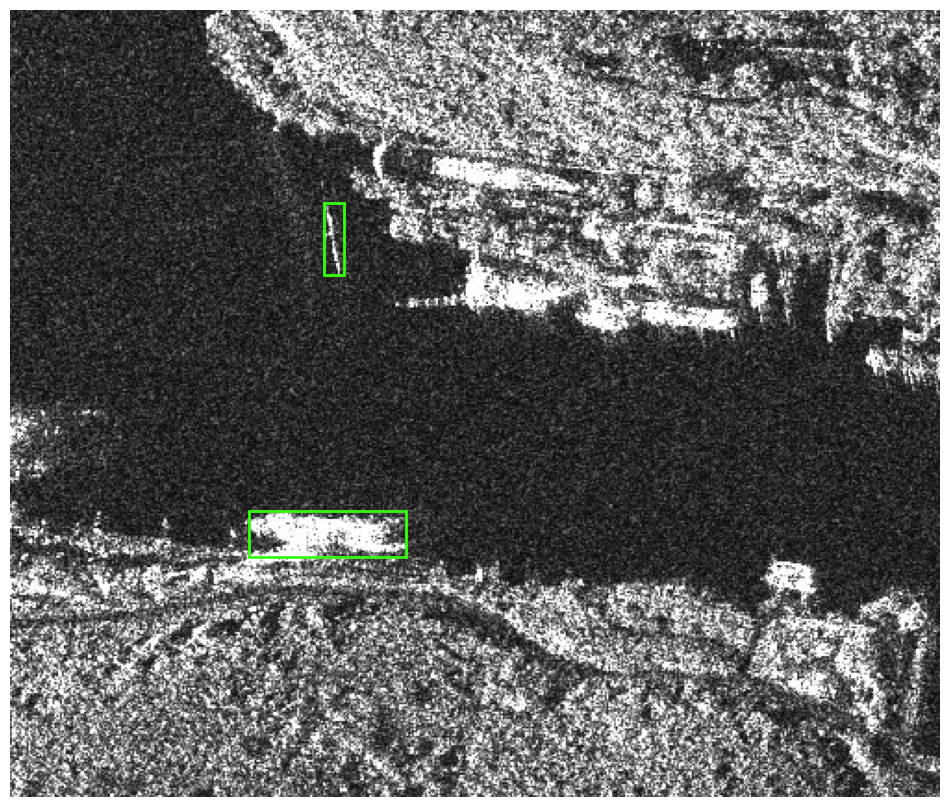

✅ JSON sauvegardé : /content/drive/MyDrive/JSONS_YOLO_SAR/000228.json
🖼️  Image annotée sauvegardée : /content/drive/MyDrive/YOLO_SAR_Predicted_Images_Annotated/000228.jpg


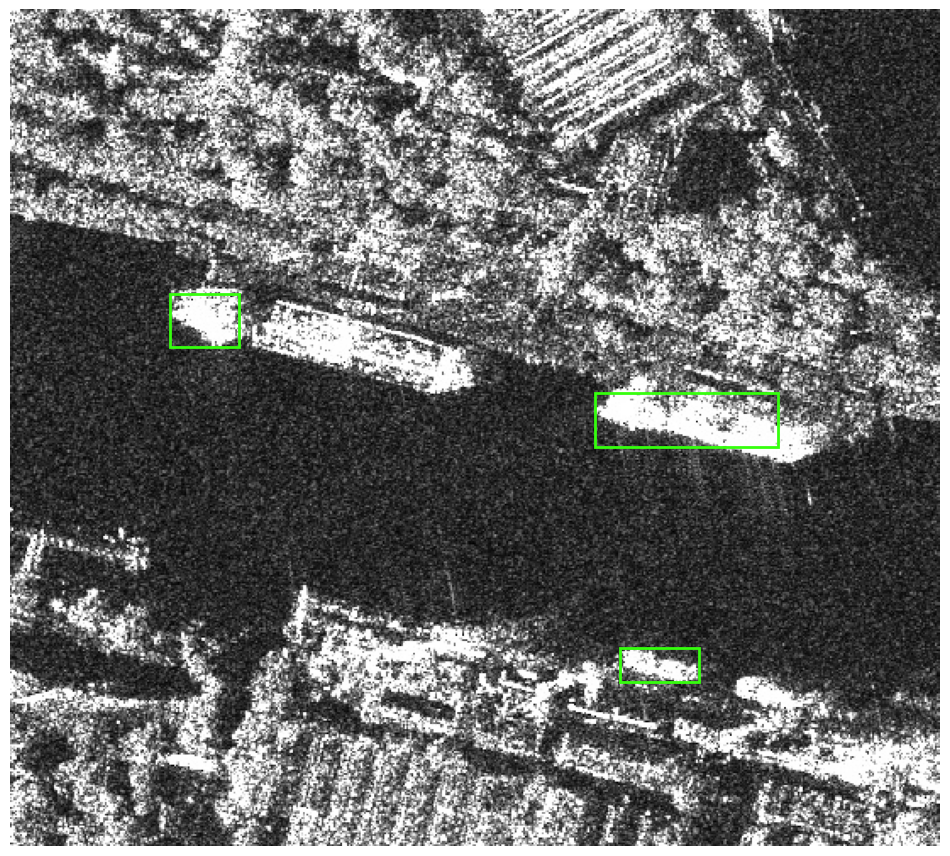

✅ JSON sauvegardé : /content/drive/MyDrive/JSONS_YOLO_SAR/000229.json
🖼️  Image annotée sauvegardée : /content/drive/MyDrive/YOLO_SAR_Predicted_Images_Annotated/000229.jpg


In [ ]:
# ✅ 1. Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ 2. Install Ultralytics
!pip install -q ultralytics

# ✅ 3. Find the biggest size for images
import os
import cv2
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

images_dir = "/content/drive/MyDrive/Predicted_SAR_Images/"
output_json_dir = "/content/drive/MyDrive/JSONS_YOLO_SAR/"
annotated_images_dir = "/content/drive/MyDrive/YOLO_SAR_Predicted_Images_Annotated/"

os.makedirs(output_json_dir, exist_ok=True)
os.makedirs(annotated_images_dir, exist_ok=True)

image_files = [f for f in os.listdir(images_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]

max_dim = 0
for img_name in image_files:
    img_path = os.path.join(images_dir, img_name)
    img = cv2.imread(img_path)
    if img is not None:
        h, w = img.shape[:2]
        max_dim = max(max_dim, h, w)
print(f"🔍 Taille maximale détectée : {max_dim}")

# ✅ 4. Starting predictions
!yolo task=detect mode=predict \
  model=/content/drive/MyDrive/Pretrained_Custom_Models/YOLO_V10_SSDD.pt \
  conf=0.4 iou=0.5 imgsz={max_dim} \
  source={images_dir} \
  save=True save_txt=True name=predict_all

# ✅ 5. Read predictions
labels_dir = "/content/runs/detect/predict_all/labels"
categories = [{"id": 0, "name": "Ship"}]

for label_file in sorted(os.listdir(labels_dir)):
    image_name = label_file.replace(".txt", ".jpg")
    image_path = os.path.join(images_dir, image_name)
    label_path = os.path.join(labels_dir, label_file)

    if not os.path.exists(image_path):
        print(f"⚠️ Image non trouvée : {image_path}")
        continue

    img = cv2.imread(image_path)
    height, width = img.shape[:2]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    annotations = []
    boxes = []
    with open(label_path, 'r') as f:
        for ann_id, line in enumerate(f):
            class_id, x_center, y_center, w, h = map(float, line.strip().split())
            x_min = (x_center - w / 2) * width
            y_min = (y_center - h / 2) * height
            box_w = w * width
            box_h = h * height
            boxes.append([x_min, y_min, box_w, box_h])

            annotations.append({
                "id": ann_id,
                "image_id": 0,
                "category_id": int(class_id),
                "bbox": [x_min, y_min, box_w, box_h],
                "area": box_w * box_h,
                "iscrowd": 0
            })

    # 🎯 Affichage matplotlib (sans texte)
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img_rgb)
    for x, y, w, h in boxes:
        rect = Rectangle((x, y), w, h, edgecolor='#35ff0d', linewidth=2, facecolor='none')
        ax.add_patch(rect)
    plt.axis('off')

    # ✅ Dsiplay
    plt.show()

    # ✅ Save the annotated images
    annotated_img_path = os.path.join(annotated_images_dir, image_name)
    fig.savefig(annotated_img_path, bbox_inches='tight', pad_inches=0)
    plt.close(fig)

    # 📤 Save JSON COCO
    coco_dict = {
        "images": [{
            "id": 0,
            "file_name": image_name,
            "width": width,
            "height": height
        }],
        "annotations": annotations,
        "categories": categories
    }

    json_filename = os.path.splitext(image_name)[0] + ".json"
    json_path = os.path.join(output_json_dir, json_filename)
    with open(json_path, 'w') as json_file:
        json.dump(coco_dict, json_file, indent=2)

    print(f"✅ JSON saved : {json_path}")
    print(f"🖼️  Annotated Image saved : {annotated_img_path}")